In [1]:
def gaussian_psf(size=21, sigma=3):
    ax = np.arange(-size // 2 + 1., size // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    psf = np.exp(-(xx**2 + yy**2) / (2. * sigma**2))
    psf /= np.sum(psf)
    return psf

In [2]:
def wiener_deconvolution(img, psf, K):
    img = img.astype(np.float32) / 255.0

    # Creating the zero array
    psf_padded = np.zeros_like(img)
    kh, kw = psf.shape
    
    # Place PSF in the center of the padded array
    start_h = (img.shape[0] - kh) // 2
    start_w = (img.shape[1] - kw) // 2
    psf_padded[start_h:start_h+kh, start_w:start_w+kw] = psf

    # Use ifftshift to move the center to (0,0) for the FFT

    psf_padded = np.fft.ifftshift(psf_padded)

    # FFT and Deconvolution logic
    IMG = np.fft.fft2(img)
    PSF = np.fft.fft2(psf_padded)

    PSF_conj = np.conj(PSF)
    denom = (np.abs(PSF)**2 + K)

    result = (PSF_conj / denom) * IMG
    result = np.fft.ifft2(result)
    result = np.real(result) 

    result = np.clip(result * 255, 0, 255).astype(np.uint8)
    return result

✅ All images (Original, Blurred, and Restored) saved to C:\Users\DELL\Downloads\Wiener_Images9
✅ Results saved to C:\Users\DELL\Downloads\wiener_results2.xlsx
✅ Images saved to C:\Users\DELL\Downloads\Wiener_Images9


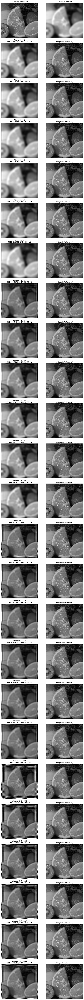

In [59]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from skimage.metrics import structural_similarity as ssim

img_path = r"C:\Users\DELL\Downloads\fruits.bmp" 

img_bgr = cv2.imread(img_path)
if img_bgr is None:
    raise ValueError("Image not found")

gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

def compute_snr(reference, test):
    noise = reference - test
    signal_power = np.mean(reference ** 2)
    noise_power = np.mean(noise ** 2)
    return 10 * np.log10(signal_power / noise_power)

ksize = 55
sigma = 9
blurred = cv2.GaussianBlur(gray, (ksize, ksize), sigma)

psf = gaussian_psf(size=ksize, sigma=sigma)

K_values = [0.2,
0.4,
0.6,
0.8,
0.1,
0.9,
0.01,
0.02,
0.03,
0.05,
0.07,
0.09,
0.001,
0.002,
0.004,
0.006,
0.008,
0.009,
0.0001,
0.0002,
0.0004,
0.0005,
0.0007,
0.0009
]
restored = [wiener_deconvolution(blurred, psf, K) for K in K_values]
ssim_values = []
snr_values = []

# ==============================
# SETUP FOLDER & SAVE REF IMAGES
# ==============================
save_folder = r"C:\Users\DELL\Downloads\Wiener_Images9"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

# Save Original
cv2.imwrite(os.path.join(save_folder, "0_Original.png"), gray)

# Save Blurred with info
blurred_to_save = blurred.copy()
cv2.putText(blurred_to_save, f"Blurred: k={ksize} sig={sigma}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255), 1)
cv2.imwrite(os.path.join(save_folder, "1_Blurred.png"), blurred_to_save)

# ==============================
# LOOP FOR RESTORED IMAGES
# ==============================
for i, rec in enumerate(restored):
    ssim_val = ssim(gray, rec, data_range=rec.max() - rec.min())
    ssim_values.append(ssim_val)

    snr_val = compute_snr(gray.astype(np.float32), rec.astype(np.float32))
    snr_values.append(snr_val)
    
    K = K_values[i]
    img_to_save = rec.copy()
    label = f"SSIM: {ssim_val:.4f}, SNR: {snr_val:.2f}"
    
    cv2.putText(img_to_save, label, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255), 1)
    
    img_filename = os.path.join(save_folder, f"K_{K}.png")
    cv2.imwrite(img_filename, img_to_save)

# ==============================
# SAVE RESULTS TO EXCEL
# ==============================
results = []
for K, ssim_val, snr_val in zip(K_values, ssim_values, snr_values):
    results.append({
        "ksize": ksize,
        "sigma": sigma,
        "k": K,
        "ssim": round(ssim_val, 4),
        "psnr": round(snr_val, 2)
    })

df = pd.DataFrame(results)
excel_path = r"C:\Users\DELL\Downloads\wiener_results2.xlsx"
df.to_excel(excel_path, index=False)

print(f"✅ All images (Original, Blurred, and Restored) saved to {save_folder}")
print(f"✅ Results saved to {excel_path}")
print(f"✅ Images saved to {save_folder}")

# DISPLAY RESULTS

rows = len(K_values) + 1   #for reference row
cols = 2

plt.figure(figsize=(10, 4 * rows))

# Reference Row
plt.subplot(rows, cols, 1)
plt.imshow(gray, cmap='gray')
plt.title("Original (Grayscale)")
plt.axis("off")

plt.subplot(rows, cols, 2)
plt.imshow(blurred, cmap='gray')
plt.title("Gaussian Blurred")
plt.axis("off")

#  Wiener Rows
for i, (K, rec, ssim_val, snr_val) in enumerate(
        zip(K_values, restored, ssim_values, snr_values), start=1):

    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rec, cmap='gray')
    plt.title(f"Wiener K={K}\nSSIM={ssim_val:.4f}, SNR={snr_val:.2f} dB")
    plt.axis("off")

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Original (Reference)")
    plt.axis("off")


plt.tight_layout()
plt.show()
#0.1-0.0009

✅ All images (Original, Blurred, and Restored) saved to C:\Users\DELL\Downloads\Wiener_Images10
✅ Results saved to C:\Users\DELL\Downloads\wiener_results2.xlsx
✅ Images saved to C:\Users\DELL\Downloads\Wiener_Images10


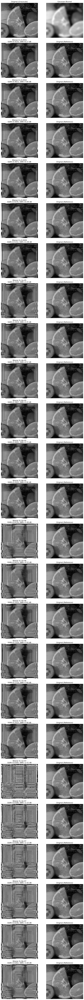

In [60]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from skimage.metrics import structural_similarity as ssim

img_path = r"C:\Users\DELL\Downloads\fruits.bmp" 

img_bgr = cv2.imread(img_path)
if img_bgr is None:
    raise ValueError("Image not found")

gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

def compute_snr(reference, test):
    noise = reference - test
    signal_power = np.mean(reference ** 2)
    noise_power = np.mean(noise ** 2)
    return 10 * np.log10(signal_power / noise_power)

ksize = 55
sigma = 9
blurred = cv2.GaussianBlur(gray, (ksize, ksize), sigma)

psf = gaussian_psf(size=ksize, sigma=sigma)

K_values = [0.0001,
0.0002,
0.0004,
0.0005,
0.0007,
0.0009,
0.00001,
0.00002,
0.00004,
0.00006,
0.00008,
0.00009,
0.000001,
0.000002,
0.000004,
0.000005,
0.000007,
0.000009,
0.0000001,
0.0000003,
0.0000004,
0.0000006,
0.0000007,
0.0000009,

]
restored = [wiener_deconvolution(blurred, psf, K) for K in K_values]
ssim_values = []
snr_values = []

# ==============================
# SETUP FOLDER & SAVE REF IMAGES
# ==============================
save_folder = r"C:\Users\DELL\Downloads\Wiener_Images10"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

# Save Original
cv2.imwrite(os.path.join(save_folder, "0_Original.png"), gray)

# Save Blurred with info
blurred_to_save = blurred.copy()
cv2.putText(blurred_to_save, f"Blurred: k={ksize} sig={sigma}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255), 1)
cv2.imwrite(os.path.join(save_folder, "1_Blurred.png"), blurred_to_save)

# ==============================
# LOOP FOR RESTORED IMAGES
# ==============================
for i, rec in enumerate(restored):
    ssim_val = ssim(gray, rec, data_range=rec.max() - rec.min())
    ssim_values.append(ssim_val)

    snr_val = compute_snr(gray.astype(np.float32), rec.astype(np.float32))
    snr_values.append(snr_val)
    
    K = K_values[i]
    img_to_save = rec.copy()
    label = f"SSIM: {ssim_val:.4f}, SNR: {snr_val:.2f}"
    
    cv2.putText(img_to_save, label, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255), 1)
    
    img_filename = os.path.join(save_folder, f"K_{K}.png")
    cv2.imwrite(img_filename, img_to_save)

# ==============================
# SAVE RESULTS TO EXCEL
# ==============================
results = []
for K, ssim_val, snr_val in zip(K_values, ssim_values, snr_values):
    results.append({
        "ksize": ksize,
        "sigma": sigma,
        "k": K,
        "ssim": round(ssim_val, 4),
        "psnr": round(snr_val, 2)
    })

df = pd.DataFrame(results)
excel_path = r"C:\Users\DELL\Downloads\wiener_results2.xlsx"
df.to_excel(excel_path, index=False)

print(f"✅ All images (Original, Blurred, and Restored) saved to {save_folder}")
print(f"✅ Results saved to {excel_path}")
print(f"✅ Images saved to {save_folder}")

# DISPLAY RESULTS

rows = len(K_values) + 1   #for reference row
cols = 2

plt.figure(figsize=(10, 4 * rows))

# Reference Row
plt.subplot(rows, cols, 1)
plt.imshow(gray, cmap='gray')
plt.title("Original (Grayscale)")
plt.axis("off")

plt.subplot(rows, cols, 2)
plt.imshow(blurred, cmap='gray')
plt.title("Gaussian Blurred")
plt.axis("off")

#  Wiener Rows
for i, (K, rec, ssim_val, snr_val) in enumerate(
        zip(K_values, restored, ssim_values, snr_values), start=1):

    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rec, cmap='gray')
    plt.title(f"Wiener K={K}\nSSIM={ssim_val:.4f}, SNR={snr_val:.2f} dB")
    plt.axis("off")

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Original (Reference)")
    plt.axis("off")


plt.tight_layout()
plt.show()
#0.0001-0.0000009

In [61]:
def wiener_deconvolution(img, psf, K):
    img = img.astype(np.float32) / 255.0

    # Creating the zero array
    psf_padded = np.zeros_like(img)
    kh, kw = psf.shape
    
    # Place PSF in the center of the padded array
    start_h = (img.shape[0] - kh) // 2
    start_w = (img.shape[1] - kw) // 2
    psf_padded[start_h:start_h+kh, start_w:start_w+kw] = psf

    # Use ifftshift to move the center to (0,0) for the FFT

    psf_padded = np.fft.ifftshift(psf_padded)

    # FFT and Deconvolution logic
    IMG = np.fft.fft2(img)
    PSF = np.fft.fft2(psf_padded)

    PSF_conj = np.conj(PSF)
    denom = (np.abs(PSF)**2 + K)

    result = (PSF_conj / denom) * IMG
    result = np.fft.ifft2(result)
    result = np.real(result) 

    result = np.clip(result * 255, 0, 255).astype(np.uint8)
    return result

✅ Images saved to: C:\Users\DELL\Downloads\Wiener_Images13
✅ Excel saved to: C:\Users\DELL\Downloads\wiener_results2.xlsx


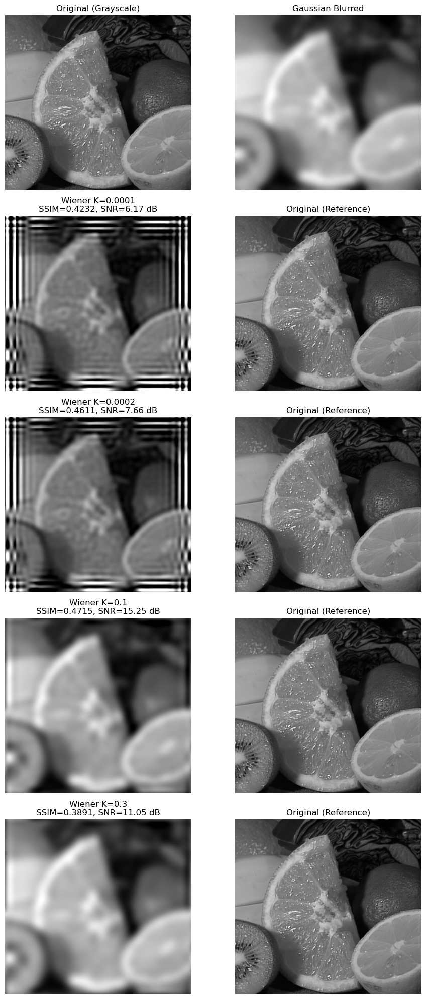

In [66]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from skimage.metrics import structural_similarity as ssim

# ==============================
# IMAGE LOADING
# ==============================
img_path = r"C:\Users\DELL\Downloads\fruits.bmp"

img_bgr = cv2.imread(img_path)
if img_bgr is None:
    raise ValueError("Image not found")

gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

# ==============================
# METRIC FUNCTIONS
# ==============================
def compute_snr(reference, test):
    noise = reference - test
    signal_power = np.mean(reference ** 2)
    noise_power = np.mean(noise ** 2)
    return 10 * np.log10(signal_power / noise_power)

# ==============================
# PARAMETERS
# ==============================
ksize = 55
sigma = 9

K_values = [
    0.0001,
    0.0002,
    0.1,
    0.3
]

# ==============================
# GAUSSIAN BLUR
# ==============================
blurred = cv2.GaussianBlur(gray, (ksize, ksize), sigma)

# ==============================
# PSF + WIENER
# ==============================
psf = gaussian_psf(size=ksize, sigma=sigma)
restored = [wiener_deconvolution(blurred, psf, K) for K in K_values]

# ==============================
# METRICS STORAGE
# ==============================
ssim_values = []
snr_values = []

# ==============================
# OUTPUT FOLDER
# ==============================
save_folder = r"C:\Users\DELL\Downloads\Wiener_Images13"
os.makedirs(save_folder, exist_ok=True)

# ==============================
# SAVE ORIGINAL IMAGE
# ==============================
cv2.imwrite(os.path.join(save_folder, "0_Original.png"), gray)

# ==============================
# BASELINE: BLURRED METRICS
# ==============================
ssim_blurred = ssim(gray, blurred, data_range=blurred.max() - blurred.min())
snr_blurred = compute_snr(gray.astype(np.float32), blurred.astype(np.float32))

blurred_to_save = blurred.copy()

label_blur_1 = f"Gaussian Blur | ksize={ksize}, sigma={sigma}"
label_blur_2 = f"SSIM: {ssim_blurred:.4f}, SNR: {snr_blurred:.2f} dB"

cv2.putText(
    blurred_to_save,
    label_blur_1,
    (10, 30),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.6,
    (255),
    1
)

cv2.putText(
    blurred_to_save,
    label_blur_2,
    (10, 55),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.6,
    (255),
    1
)

cv2.imwrite(os.path.join(save_folder, "1_Blurred.png"), blurred_to_save)

cv2.imwrite(os.path.join(save_folder, "1_Blurred.png"), blurred_to_save)

# ==============================
# WIENER RESULTS
# ==============================
for i, rec in enumerate(restored):
    ssim_val = ssim(gray, rec, data_range=rec.max() - rec.min())
    snr_val = compute_snr(gray.astype(np.float32), rec.astype(np.float32))

    ssim_values.append(ssim_val)
    snr_values.append(snr_val)

    K = K_values[i]
    img_to_save = rec.copy()
    label = f"K={K} | SSIM: {ssim_val:.4f}, SNR: {snr_val:.2f} dB"

    cv2.putText(
        img_to_save,
        label,
        (10, 30),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.6,
        (255),
        1
    )

    cv2.imwrite(os.path.join(save_folder, f"K_{K}.png"), img_to_save)

# ==============================
# SAVE RESULTS TO EXCEL
# ==============================
results = []

# Baseline row
results.append({
    "ksize": ksize,
    "sigma": sigma,
    "k": "BLUR",
    "ssim": round(ssim_blurred, 4),
    "psnr": round(snr_blurred, 2)
})

# Wiener rows
for K, ssim_val, snr_val in zip(K_values, ssim_values, snr_values):
    results.append({
        "ksize": ksize,
        "sigma": sigma,
        "k": K,
        "ssim": round(ssim_val, 4),
        "psnr": round(snr_val, 2)
    })

df = pd.DataFrame(results)
excel_path = r"C:\Users\DELL\Downloads\wiener_results2.xlsx"
df.to_excel(excel_path, index=False)

print(f"✅ Images saved to: {save_folder}")
print(f"✅ Excel saved to: {excel_path}")

# ==============================
# DISPLAY RESULTS
# ==============================
rows = len(K_values) + 1
cols = 2

plt.figure(figsize=(10, 4 * rows))

# Reference row
plt.subplot(rows, cols, 1)
plt.imshow(gray, cmap='gray')
plt.title("Original (Grayscale)")
plt.axis("off")

plt.subplot(rows, cols, 2)
plt.imshow(blurred, cmap='gray')
plt.title("Gaussian Blurred")
plt.axis("off")

# Wiener rows
for i, (K, rec, ssim_val, snr_val) in enumerate(
        zip(K_values, restored, ssim_values, snr_values), start=1):

    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rec, cmap='gray')
    plt.title(f"Wiener K={K}\nSSIM={ssim_val:.4f}, SNR={snr_val:.2f} dB")
    plt.axis("off")

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Original (Reference)")
    plt.axis("off")

plt.tight_layout()
plt.show()
